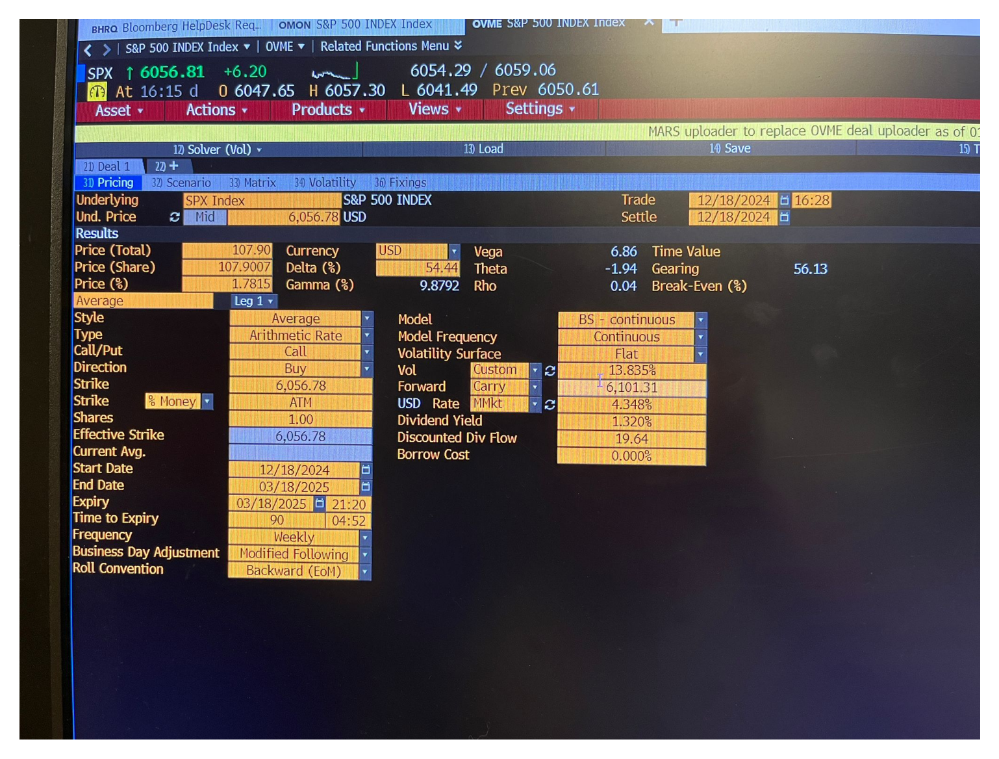

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load and display the image
image_path = "pricingsheet.jpeg" 
img = mpimg.imread(image_path)
plt.figure(dpi=300) 
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()


In [3]:
import numpy as np
import matplotlib.pyplot as plt

In [4]:
from financepy.utils import *
from financepy.market.curves import *
from financepy.products.equity import *

####################################################################
#  FINANCEPY BETA Version 0.370 - This build: 28 Oct 2024 at 20:26 #
#     This software is distributed FREE AND WITHOUT ANY WARRANTY   #
#  Report bugs as issues at https://github.com/domokane/FinancePy  #
####################################################################



In [5]:
start_averaging_date = Date(18, 12, 2025)
expiry_date = Date(18, 3, 2026)
strike_price = 6056.78


In [6]:
# Weakly observations -> 12 weeks
num_observations = int((expiry_date - start_averaging_date)/7)
num_observations

12

In [7]:
asianOption = EquityAsianOption(start_averaging_date, 
                                   expiry_date, 
                                   strike_price, 
                                   OptionTypes.EUROPEAN_CALL, 
                                   num_observations)

In [8]:
print(asianOption)

OBJECT TYPE: EquityAsianOption
START AVERAGING DATE: 18-DEC-2025
EXPIRY DATE: 18-MAR-2026
STRIKE PRICE: 6056.78
OPTION TYPE: OptionTypes.EUROPEAN_CALL
NUM OBSERVATIONS: 12


In [9]:
volatility = 0.13835
model = BlackScholes(volatility)

In [10]:
stock_price = 6056.78
interest_rate = 0.0435
dividend_yield = 0.0132

In [11]:
# Assume upward trend of stock prices
stock_prices = np.linspace(6056.78, 6056.78*1.1, 12)
stock_prices

array([6056.78      , 6111.84163636, 6166.90327273, 6221.96490909,
       6277.02654545, 6332.08818182, 6387.14981818, 6442.21145455,
       6497.27309091, 6552.33472727, 6607.39636364, 6662.458     ])

In [12]:
weeks = np.arange(0,12)*7
weeks

array([ 0,  7, 14, 21, 28, 35, 42, 49, 56, 63, 70, 77])

In [13]:
valuation_dates = []
for t in weeks:
    valuation_dates = valuation_dates+ [Date(18, 12, 2025).add_days(t)]

valuation_dates

[18-DEC-2025,
 25-DEC-2025,
 01-JAN-2026,
 08-JAN-2026,
 15-JAN-2026,
 22-JAN-2026,
 29-JAN-2026,
 05-FEB-2026,
 12-FEB-2026,
 19-FEB-2026,
 26-FEB-2026,
 05-MAR-2026]

In [14]:
numPath = 1000
seed = 42

geometric_prices = []
curran_prices = []
turnbull_wakeman_prices = []
montecarlo_prices = []

In [15]:
for i in range(0, len(valuation_dates)):

    valuation_date = valuation_dates[i]
    
    discount_curve = DiscountCurveFlat(valuation_date, interest_rate)
    dividend_curve = DiscountCurveFlat(valuation_date, dividend_yield)
    
    stock_price = stock_prices[i]

    accruedAverage = np.mean(stock_prices[0:i])
    
    v_g = asianOption.value(valuation_date, stock_price, discount_curve, dividend_curve, model, 
                  AsianOptionValuationMethods.GEOMETRIC, accruedAverage)
    
    v_c = asianOption.value(valuation_date, stock_price, discount_curve, dividend_curve, model, 
                  AsianOptionValuationMethods.CURRAN, accruedAverage)

    v_tw = asianOption.value(valuation_date, stock_price, discount_curve, dividend_curve, model, 
                  AsianOptionValuationMethods.TURNBULL_WAKEMAN, accruedAverage)

    v_mc = asianOption.value_mc(valuation_date, stock_price, discount_curve, dividend_curve, model, 
                    numPath, seed, accruedAverage)
    
    #geometric_prices.append(v_g)
    curran_prices.append(v_c)
    montecarlo_prices.append(v_mc)
    turnbull_wakeman_prices.append(v_tw)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [16]:
montecarlo_prices[0]

104.59560347759114

In [17]:
Deviation = montecarlo_prices[0] / 107.9 -1
Deviation * 100

-3.062462022621748

**Explain:**

The Monte Carlo price of the Asian Option is around 104.60 while the model from BBG estimated price is 107.9. The deviation is around 3% lower than the BBG model


Text(0.5, 0, 'Weeks into 2025')

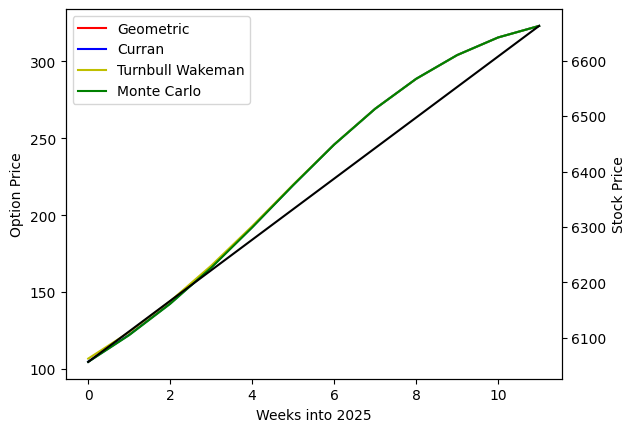

In [18]:
fig, ax1 = plt.subplots()
ax1.plot(geometric_prices, "r", label='Geometric')
ax1.plot(curran_prices, "b", label='Curran')
ax1.plot(turnbull_wakeman_prices, "y", label='Turnbull Wakeman')
ax1.plot(montecarlo_prices, "g", label='Monte Carlo')

ax1.set_ylabel('Option Price')
ax1.legend();

ax2 = ax1.twinx()
plt.plot(stock_prices, "k", label='Stock Price')
ax2.set_ylabel("Secondary Y Axis", color="k")
ax2.tick_params(axis="y", labelcolor="k")
ax2.set_ylabel('Stock Price')

ax1.set_xlabel('Weeks into 2025')

# Risk Measures

In [19]:
import numpy as np
import math
import matplotlib.pyplot as plt

# For cleaner plots in some environments
%matplotlib inline


## 1. Monte Carlo Simulation: Arithmetic-Average Asian Call

Given:
$$
dS_t = (r - q) S_t \, dt + \sigma S_t \, dW_t
$$

We discretize in \(n\_steps\) increments over \([0, T]\).  
For each simulated path:
1. **Accumulate** the stock prices across the path.
2. **Take the arithmetic average** $ A = \frac{1}{n\_steps} \sum_{k=1}^{n\_steps} S_{k} $.
3. Payoff: $\max(A - K, 0)$.
4. **Discount** at $\exp(-r T)$.

---


In [20]:
def simulate_arithmetic_asian_call(
    S0,         # Spot price at t=0
    K,          # Strike
    r,          # Risk-free rate (continuously comp.)
    q,          # Dividend yield (continuously comp.)
    sigma,      # Volatility
    T,          # Time to maturity (in years)
    n_steps,    # Number of discrete averaging points
    n_sims,     # Number of Monte Carlo simulations
    seed=None
):
    """
    Returns the Monte Carlo price of an arithmetic-average Asian call option.
    """
    if seed is not None:
        np.random.seed(seed)

    dt = T / n_steps
    discounted_payoffs = np.zeros(n_sims)

    for sim in range(n_sims):
        S = S0
        running_sum = 0.0
        for step in range(n_steps):
            z = np.random.normal(0.0, 1.0)
            # Update the stock price under risk-neutral GBM
            S = S * math.exp((r - q - 0.5*sigma**2)*dt + sigma*math.sqrt(dt)*z)
            running_sum += S
        
        # Arithmetic average
        A = running_sum / n_steps
        
        # Payoff
        payoff = max(A - K, 0.0)
        
        # Discount
        discounted_payoffs[sim] = math.exp(-r * T) * payoff

    # Monte Carlo estimate of price
    return np.mean(discounted_payoffs)


## 2. Greeks via Bump-and-Revalue

We compute:
- **Delta**: 
$$
\Delta \approx \frac{V(S_0 + h) - V(S_0 - h)}{2h}
$$
- **Gamma**: 
$$
\Gamma \approx \frac{V(S_0 + h) - 2V(S_0) + V(S_0 - h)}{h^2}
$$
- **Vega**: 
$$
\nu \approx \frac{V(\sigma + \epsilon) - V(\sigma - \epsilon)}{2\epsilon}
$$

- **Theta**: For a 1-day bump in time,

$$
\Theta \approx \frac{V(T - \delta t) - V(T)}{\delta t}
$$

(Sign conventions vary by source; some prefer a negative sign so that \(\Theta\) is negative when time passes.)


In [21]:
def bump_and_revalue_greeks(
    S0, K, r, q, sigma, T, n_steps, n_sims,
    bump_S=1.0,         # Bump in underlying price
    bump_sigma=0.0001,  # Bump in volatility
    bump_t=1.0/365.0,   # Bump in time (1 day)
    seed=None
):
    """
    Computes Delta, Gamma, Vega, and Theta for an arithmetic-average Asian call
    using a bump-and-revalue approach.
    
    Returns: (base_price, delta, gamma, vega, theta).
    """
    # --- Base price ---
    base_price = simulate_arithmetic_asian_call(S0, K, r, q, sigma, T, n_steps, n_sims, seed)

    # ========= DELTA, GAMMA =========
    # Up/down bump in underlying
    price_up = simulate_arithmetic_asian_call(S0 + bump_S, K, r, q, sigma, T, n_steps, n_sims, seed)
    price_down = simulate_arithmetic_asian_call(S0 - bump_S, K, r, q, sigma, T, n_steps, n_sims, seed)

    # Central difference for Delta
    delta = (price_up - price_down) / (2.0 * bump_S) * 100

    # Central difference for Gamma
    gamma = (price_up - 2.0*base_price + price_down) / (bump_S**2) * 10000

    # ========= VEGA =========
    # Up/down bump in volatility
    price_sigma_up = simulate_arithmetic_asian_call(S0, K, r, q, sigma + bump_sigma, T, n_steps, n_sims, seed)
    price_sigma_down = simulate_arithmetic_asian_call(S0, K, r, q, sigma - bump_sigma, T, n_steps, n_sims, seed)
    vega = (price_sigma_up - price_sigma_down) / (2.0 * bump_sigma) / 100

    # ========= THETA =========
    # Decrease T by bump_t => T_minus
    T_minus = max(T - bump_t, 0.0001)  # ensure T_minus is not negative
    price_T_minus = simulate_arithmetic_asian_call(S0, K, r, q, sigma, T_minus, n_steps, n_sims, seed)
    # One-sided difference
    theta = (price_T_minus - base_price) / bump_t /100

    return base_price, delta, gamma, vega, theta


## 3. Varying the Spot Price and Plotting

We:
1. Define baseline parameters.
2. Sweep $S_0$ from 4000 to 9000 in 12 increments.
3. Collect Price, $\Delta$, $\Gamma$, $\nu$, $\Theta$.
4. Plot them side-by-side.


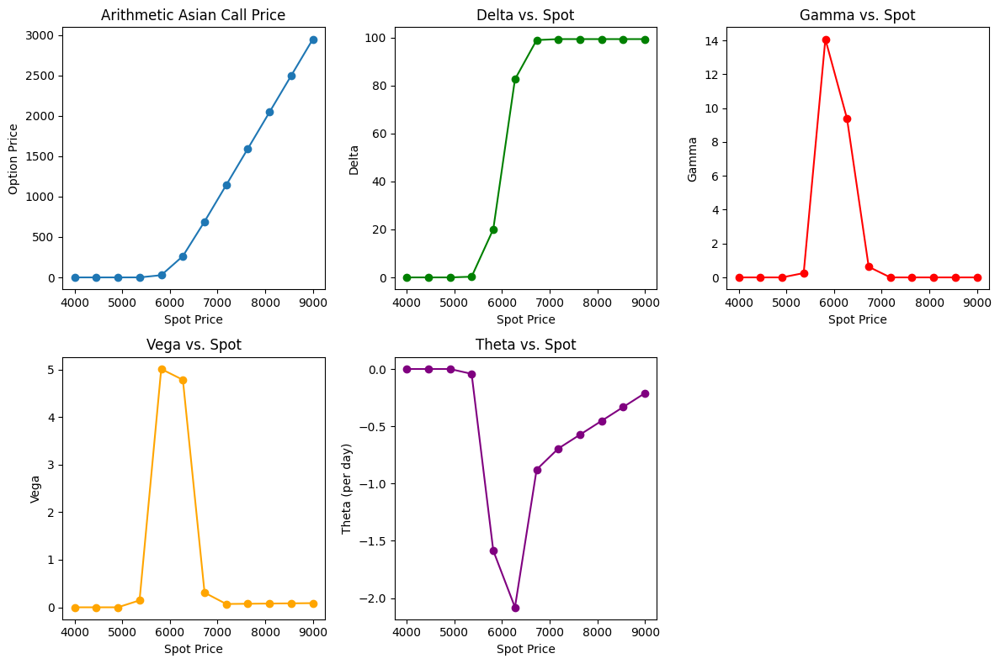

In [22]:
def run_analysis_and_plot():
    # Baseline parameters
    S0_ref   = 6056.78   # baseline spot
    K        = 6056.78   # strike (ATM)
    r_annual = 0.04348   # ~4.348% risk-free (cont.)
    q_annual = 0.01320   # ~1.320% dividend yield (cont.)
    sigma    = 0.13835   # ~13.835% volatility
    T_days   = 90        # 90 days to expiry
    T        = T_days / 365.0
    
    n_sims   = 30000
    n_steps  = 12
    seed     = 12345

    # Bump sizes
    bump_S     = 1.0
    bump_sigma = 0.0001
    bump_t     = 1.0/365.0
    
    # Range for S0
    S_range = np.linspace(4000, 9000, 12)

    # Arrays to store results
    price_array = []
    delta_array = []
    gamma_array = []
    vega_array  = []
    theta_array = []

    # Sweep over spot prices
    for spot in S_range:
        base_price, delta, gamma, vega, theta = bump_and_revalue_greeks(
            S0=spot, K=K, r=r_annual, q=q_annual,
            sigma=sigma, T=T, n_steps=n_steps, n_sims=n_sims,
            bump_S=bump_S, bump_sigma=bump_sigma, bump_t=bump_t,
            seed=seed
        )
        price_array.append(base_price)
        delta_array.append(delta)
        gamma_array.append(gamma)
        vega_array.append(vega)
        theta_array.append(theta)

    # Convert to numpy for convenience
    price_array = np.array(price_array)
    delta_array = np.array(delta_array)
    gamma_array = np.array(gamma_array)
    vega_array  = np.array(vega_array)
    theta_array = np.array(theta_array)

    # Plot
    plt.figure(figsize=(12, 8))

    # Price
    plt.subplot(2, 3, 1)
    plt.plot(S_range, price_array, 'o-', label="Price")
    plt.xlabel("Spot Price")
    plt.ylabel("Option Price")
    plt.title("Arithmetic Asian Call Price")

    # Delta
    plt.subplot(2, 3, 2)
    plt.plot(S_range, delta_array, 'o-', color="green", label="Delta")
    plt.xlabel("Spot Price")
    plt.ylabel("Delta")
    plt.title("Delta vs. Spot")

    # Gamma
    plt.subplot(2, 3, 3)
    plt.plot(S_range, gamma_array, 'o-', color="red", label="Gamma")
    plt.xlabel("Spot Price")
    plt.ylabel("Gamma")
    plt.title("Gamma vs. Spot")

    # Vega
    plt.subplot(2, 3, 4)
    plt.plot(S_range, vega_array, 'o-', color="orange", label="Vega")
    plt.xlabel("Spot Price")
    plt.ylabel("Vega")
    plt.title("Vega vs. Spot")

    # Theta
    plt.subplot(2, 3, 5)
    plt.plot(S_range, theta_array, 'o-', color="purple", label="Theta")
    plt.xlabel("Spot Price")
    plt.ylabel("Theta (per day)")
    plt.title("Theta vs. Spot")

    plt.tight_layout()
    plt.show()


# Execute the analysis and plot
run_analysis_and_plot()


**Explanation:**



## **Reference:**

### **Delta**

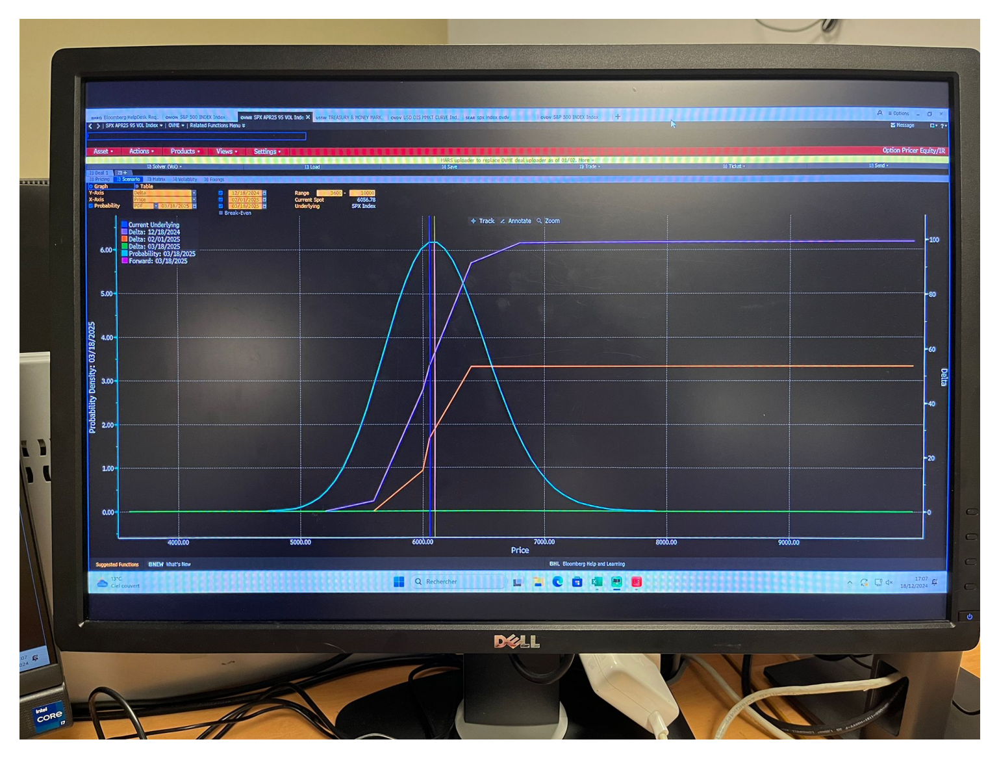

In [23]:
# Load and display the image
image_path = "Delta.jpeg" 
img = mpimg.imread(image_path)
plt.figure(dpi=300) 
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()

### **Gamma**

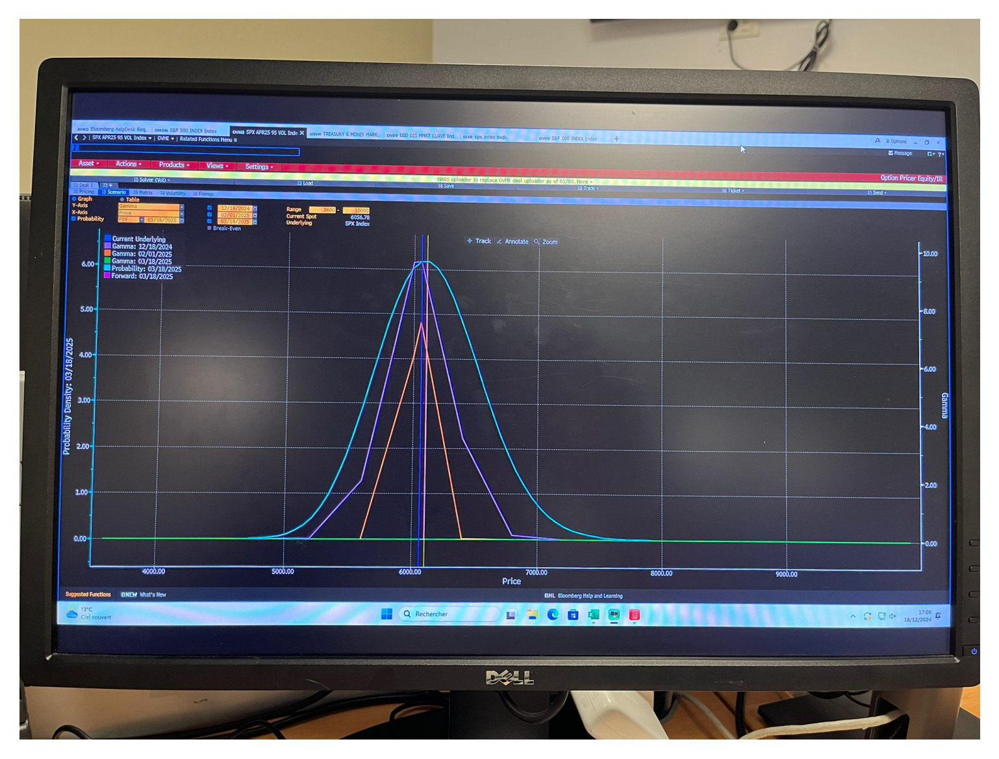

In [24]:
# Load and display the image
image_path = "Gamma.jpeg" 
img = mpimg.imread(image_path)
plt.figure(dpi=300) 
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()

### **Vega**

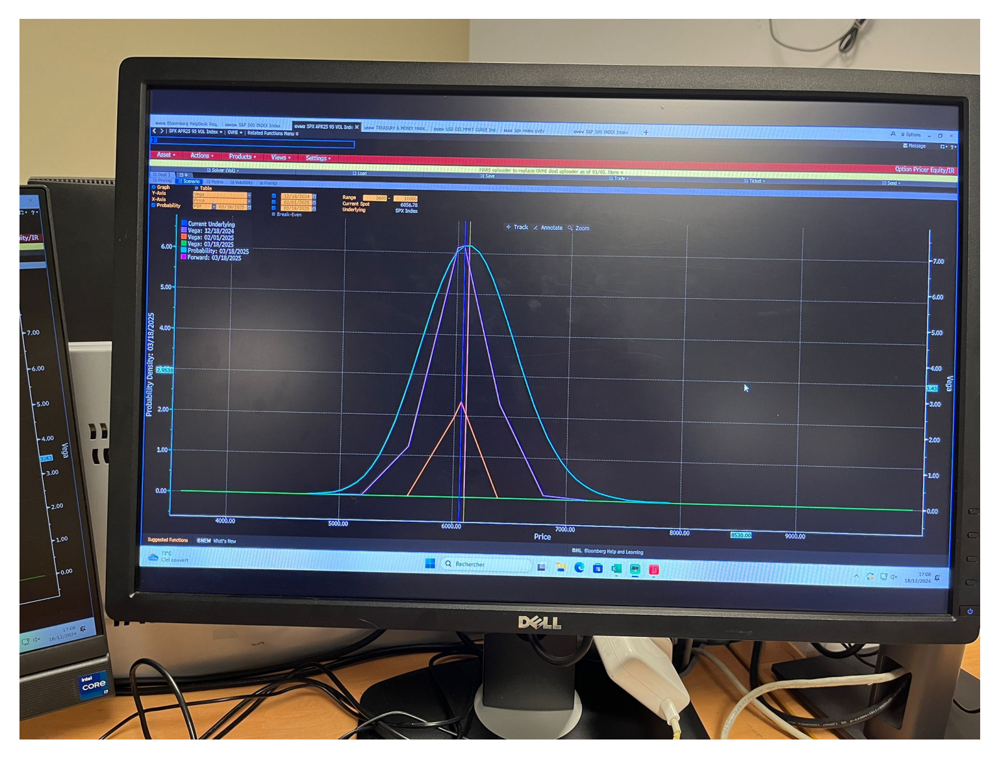

In [25]:
# Load and display the image
image_path = "Vega.jpeg" 
img = mpimg.imread(image_path)
plt.figure(dpi=300) 
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()

### **Theta**

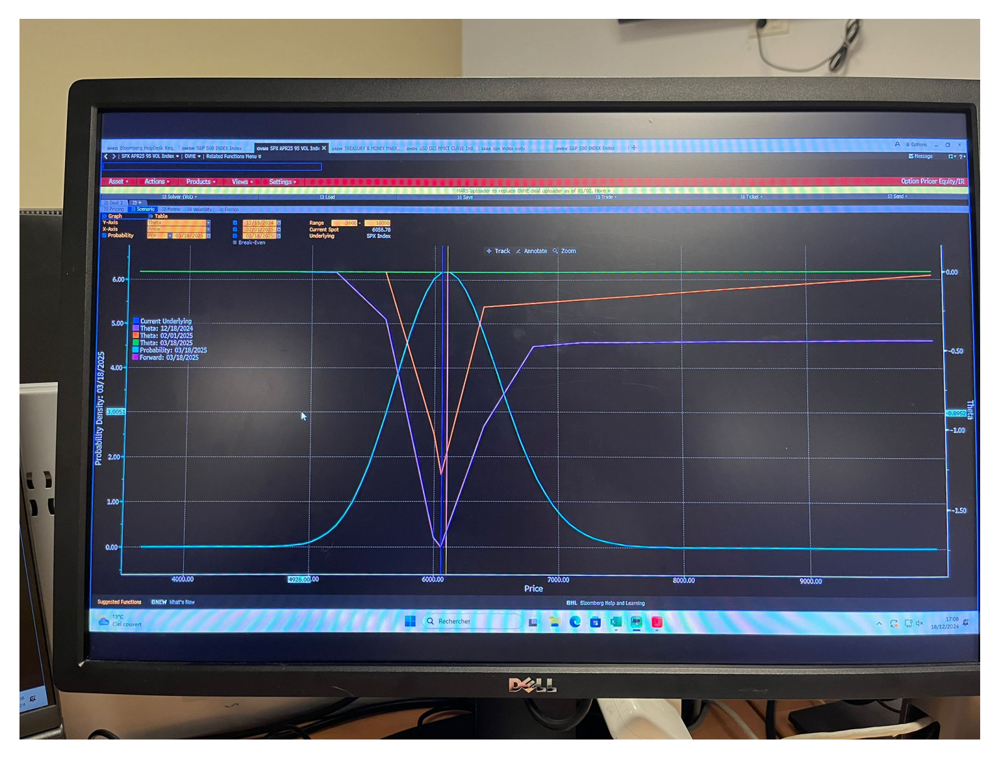

In [26]:
# Load and display the image
image_path = "Theta.jpeg" 
img = mpimg.imread(image_path)
plt.figure(dpi=300) 
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()